<a href="https://colab.research.google.com/github/sujitha365/dv-assignments/blob/main/bicycle_lane_and_path_distribution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -U googlemaps
!pip install osmnx geopandas matplotlib
!pip install folium

  Preparing metadata (setup.py) ... done
  Created wheel for googlemaps: filename=googlemaps-4.10.0-py3-none-any.whl size=40711 sha256=e442495701b3f3287bdcf678748285de3f50f6cc53681c9d2ab22d9f09bc829e
  Stored in directory: /root/.cache/pip/wheels/17/f8/79/999d5d37118fd35d7219ef57933eb9d09886c4c4503a800f84
Successfully built googlemaps
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 3.2 MB/s eta 0:00:00


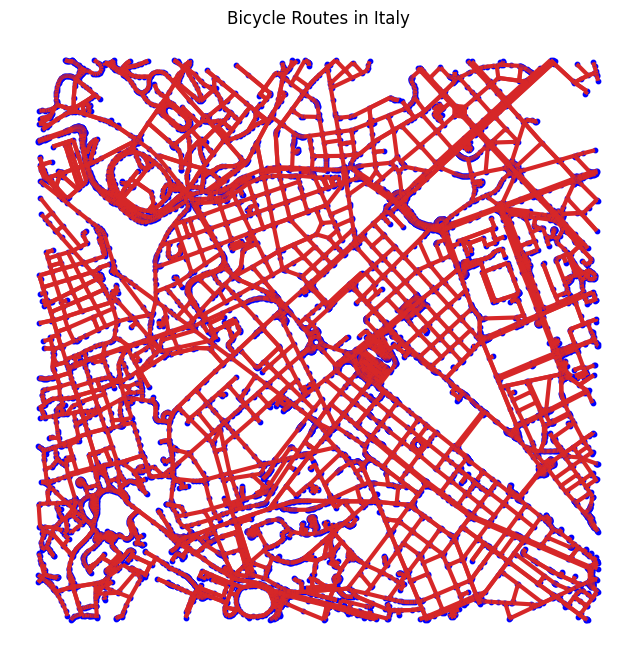

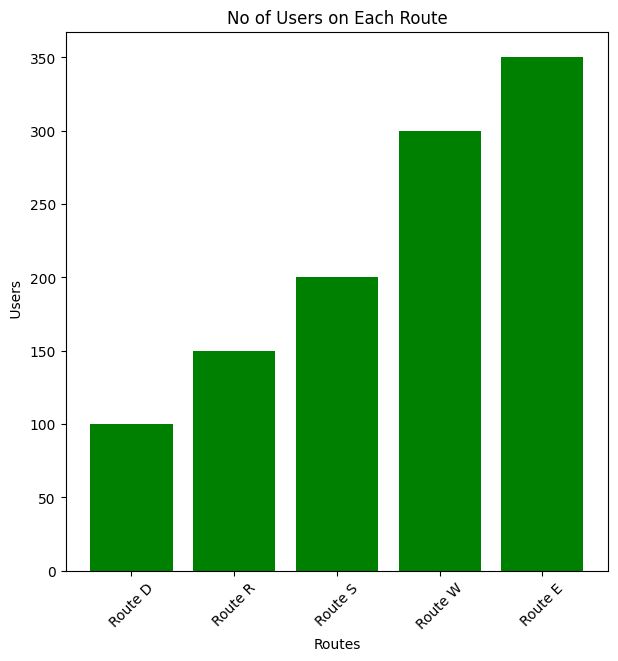

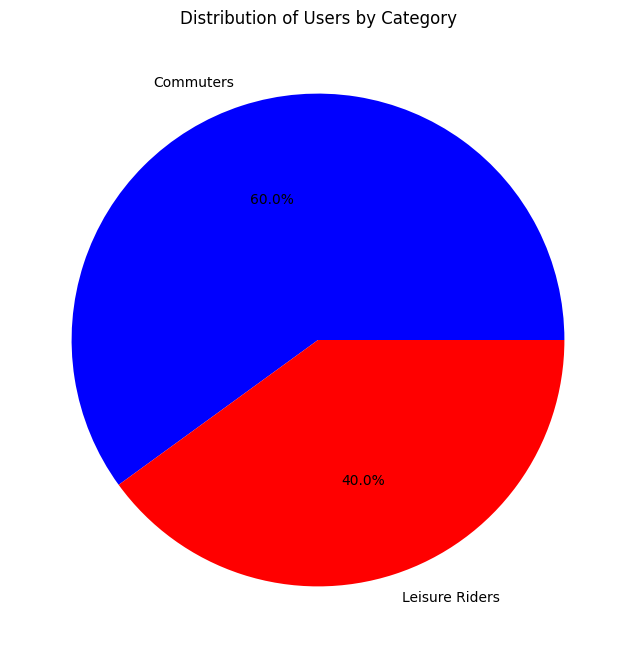

In [2]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
import folium

# Specify Italy's coordinates (latitude and longitude)
latitude = 41.9028  # Latitude of a location in Italy
longitude = 12.4964  # Longitude of a location in Italy

# Download the bicycle network data for the specified location in Italy
G = ox.graph_from_point((latitude, longitude), dist=1500, network_type='bike', simplify=False)

# Create nodes and edges GeoDataFrames and fill in all edge geometry attributes
nodes, edges = ox.graph_to_gdfs(G, nodes=True, edges=True)

# Plot the bicycle routes
fig, ax = plt.subplots(figsize=(12, 8))
edges.plot(ax=ax, linewidth=3, edgecolor='tab:red')
nodes.plot(ax=ax, markersize=10, color='blue')
plt.title('Bicycle Routes in Italy')
plt.axis('off')
plt.show()

# Sample route data with user counts
route_names = ['Route D', 'Route R', 'Route S', 'Route W', 'Route E']
user_counts = [100, 150, 200, 300, 350]

# Sample user category data
user_categories = ['Commuters', 'Leisure Riders', 'Commuters', 'Leisure Riders', 'Commuters']

# Bar chart: Number of users on each route
plt.figure(figsize=(7, 7))
plt.bar(route_names, user_counts, color='green')
plt.xlabel('Routes')
plt.ylabel(' Users')
plt.title('No of Users on Each Route')
plt.xticks(rotation=45)
plt.show()

# Pie chart: Distribution of users by category
category_counts = {}
for category in user_categories:
    if category in category_counts:
        category_counts[category] += 1
    else:
        category_counts[category] = 1

categories = list(category_counts.keys())
category_values = list(category_counts.values())

plt.figure(figsize=(8, 8))
plt.pie(category_values, labels=categories, autopct='%1.1f%%', colors=['blue', 'red'])
plt.title('Distribution of Users by Category')
plt.show()

# Define the coordinates of restricted places in Italy
restricted_places = [
    {'name': 'Hotel Rome', 'location': [41.9028, 12.4964]},
    {'name': 'Cafe Milano', 'location': [45.4641, 9.1915]},
    # Add more restricted places and their coordinates in Italy here
]

# Mark restricted places on the map
m = folium.Map(location=[latitude, longitude], zoom_start=15)

for place in restricted_places:
    folium.Marker(
        location=place['location'],
        popup=place['name'],
        icon=folium.Icon(color='red')
    ).add_to(m)

# Display the map with restricted places in Italy
m

# Add the bicycle routes as a GeoJSON layer in the Italy map
m = folium.Map(location=[latitude, longitude], zoom_start=15)
edges_geojson = edges.to_crs(epsg=4326).to_json()
nodes_geojson = nodes.to_crs(epsg=4326).to_json()

# Add the bicycle routes as a GeoJSON layer
folium.GeoJson(edges_geojson, name='Bicycle Lane Distribution', style_function=lambda x: {'color': 'blue', 'weight': 2}).add_to(m)

# Display the map with bicycle routes in Italy
m
